In [1]:
#Import libraries

import time
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
from scipy.sparse import csr_matrix
import logging
#from skbio.stats.composition import clr

import matplotlib.pyplot as plt
import matplotlib.axes as axes
#For CLR of ADTs
import scipy
import scipy.stats
from sklearn.preprocessing import scale

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.6.0 anndata==0.7.4 umap==0.4.6 numpy==1.18.5 scipy==1.5.0 pandas==1.0.5 scikit-learn==0.23.1 statsmodels==0.11.1 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3


In [3]:
prostate_info = pd.read_csv("/home/unix/sjohri/valab_sjohri/projects/ex-vivo/data/final_patient_metadata.csv") # metadata table
prostate_info.tail()

,CCPM Patient ID,CCPM Sample ID,Arm,Cohort,Age,Race,Gleason,PSA (screening),T Stage,MRI (screening),MRI Pre-RP,PSA before RP,RP Staging
13,2100026,2100026_T1,1,B1,58,White,8 (4+4),7.45,cT2c,PI-RADS 4 lesions in the left and right periph...,Findings consistent with therapy-related chang...,0.02,"ypT2N0, 0.1cm tumor dimension"
14,2100027,2100027_T1,1,B1,68,White,8 (4+4),3.20,cT3b,There is a 2.2 cm focal lesion in the peripher...,Posttreatment change and slightly decreased si...,<0.02,"ypT3bN0, 2.8cm tumor dimension, right and left..."
15,2100028,2100028_T1,2,B1,69,White,7 (4+3),2.16,cT1c,2.1 cm PI-RADS 5 lesion in left anterior trans...,Significant artifacts are lessening sensitivit...,<0.02,"ypT2N0, 0.7cm tumor dimension"
16,2100030,2100030_T1,2,B1,69,Black,9 (4+5),15.84,cT3a,A 2 cm right peripheral mid-base prostate lesi...,Post treatment changes of the prostate includi...,0.05,"ypT3bN1, 1.5cm tumor dimension, right posterio..."
17,2100037,2100037_T1,2,B1,51,White,9 (5+4),27.70,cT3b,"3.4 cm T2 intermediate, restricting, enhancing...",Interval decrease in size of the prostate meas...,0.1,"ypT3bN1, 1.1cm tumor dimension, left and right..."


## Preprocessing (Filtering and QC stats)

Reading in file: DFCI_2100001_T1


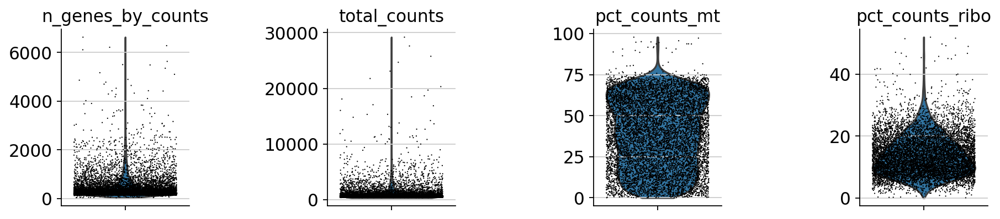

Reading in file: DFCI_2100008_T1


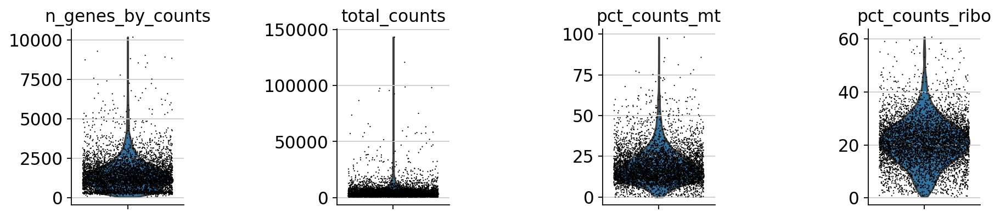

Reading in file: DFCI_2100009_T1


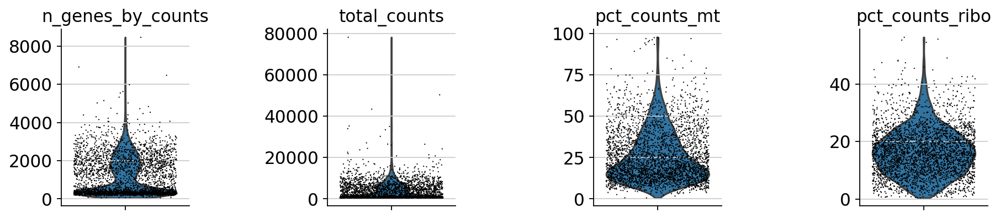

Reading in file: DFCI_2100013_T1


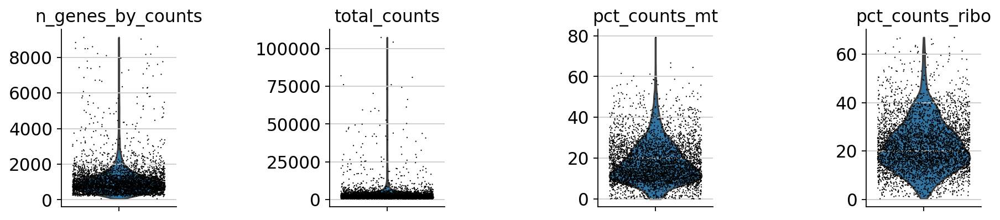

Reading in file: DFCI_2100015_T1


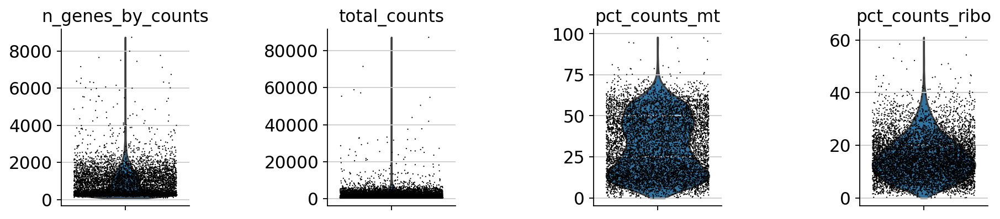

Reading in file: DFCI_2100017_T1


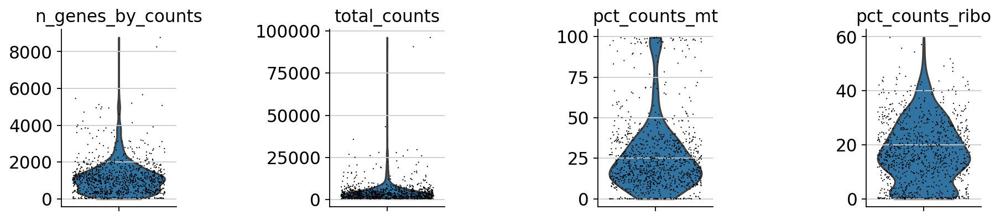

Reading in file: DFCI_2100018_T1


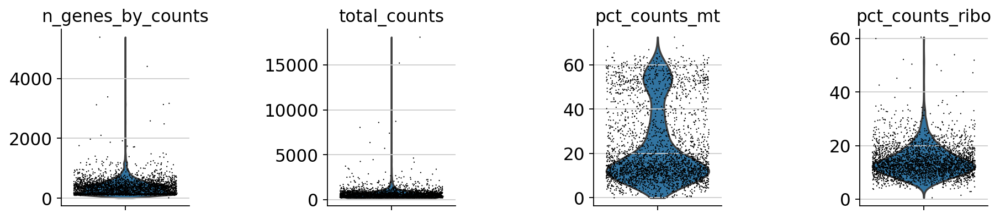

Reading in file: DFCI_2100019_T1


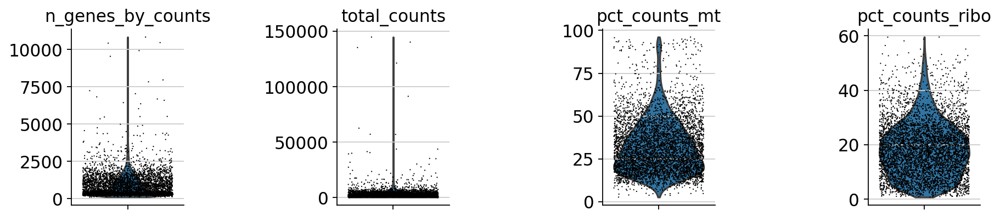

Reading in file: DFCI_2100020_T1


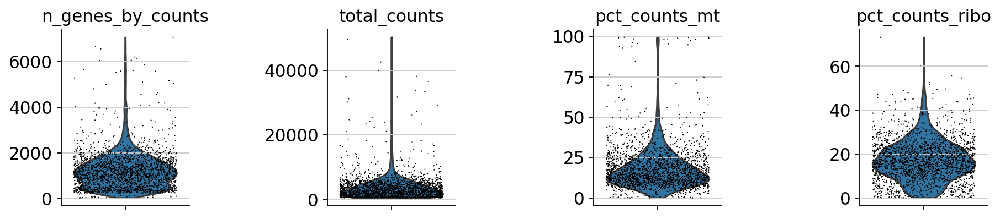

Reading in file: DFCI_2100021_T1


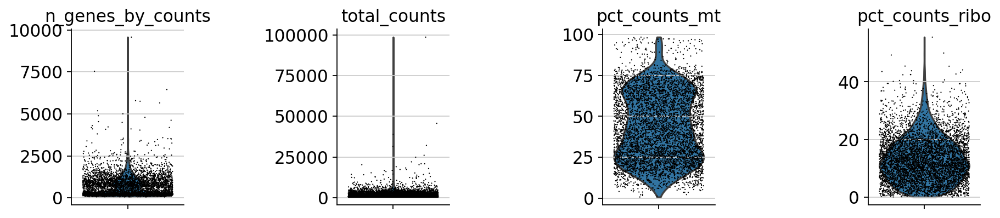

Reading in file: DFCI_2100022_T1


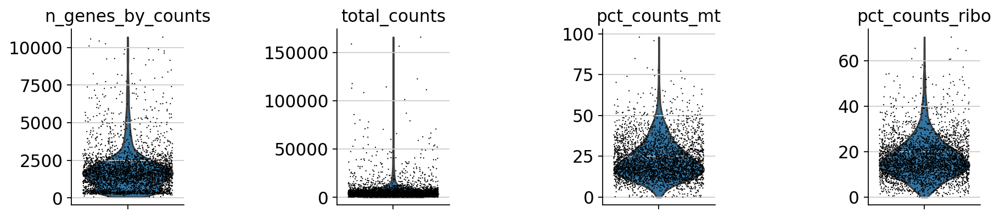

Reading in file: DFCI_2100023_T1


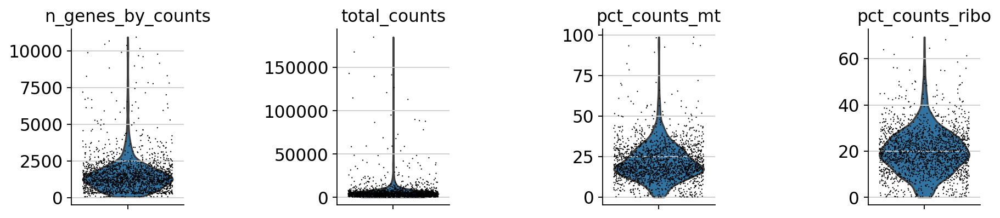

Reading in file: DFCI_2100025_T1


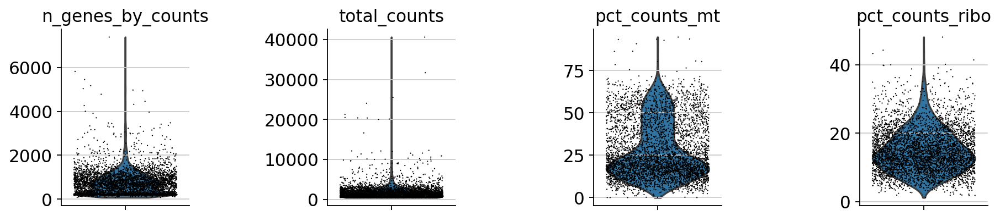

Reading in file: DFCI_2100026_T1


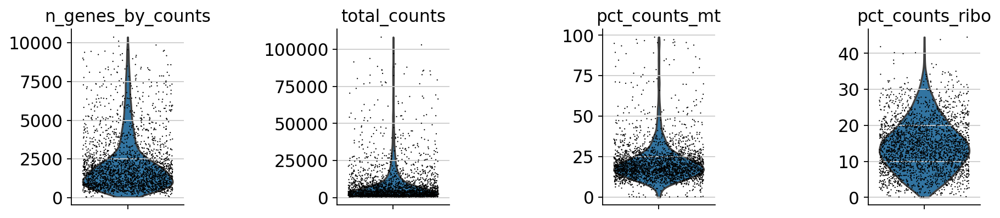

Reading in file: DFCI_2100027_T1


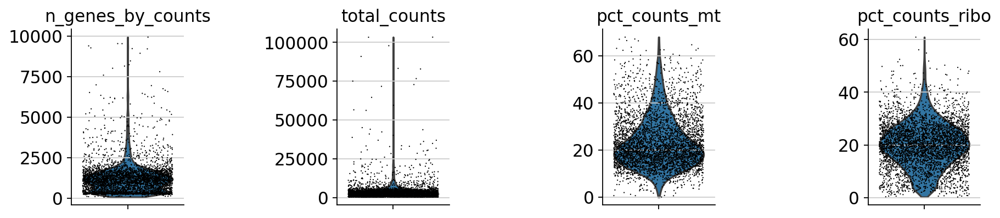

Reading in file: DFCI_2100028_T1


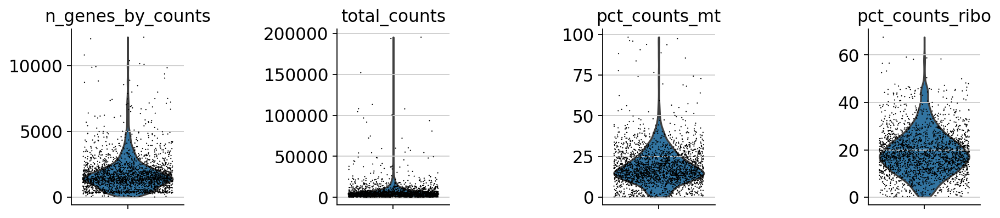

Reading in file: DFCI_2100030_T1


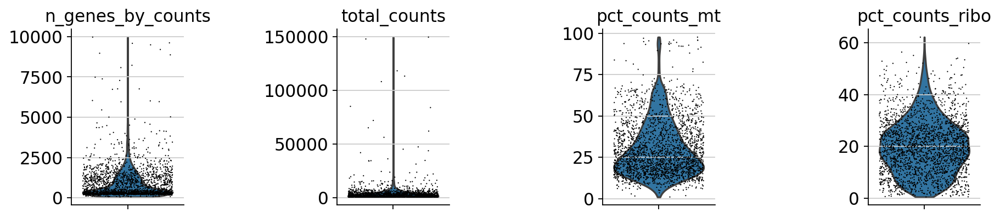

Reading in file: DFCI_2100037_T1


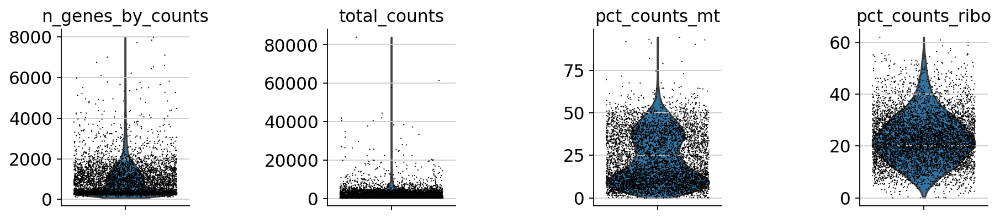

In [4]:
adata = [None]*prostate_info.shape[0]
# adata = [None]*3

mtxs = prostate_info['CCPM Sample ID'].tolist()
mtxs = ["DFCI_" + x for x in mtxs]
meta_info = prostate_info.to_dict()

for index in range(0,len(mtxs)):
    
    ## read in 10x matrix files
    print("Reading in file: {}".format(mtxs[index]))
    adata[index] = sc.read_csv("/home/unix/sjohri/valab_sjohri/projects/ex-vivo/scanpy/contam_free_data/"+mtxs[index]+"_contam_free.csv").T
    adata[index].var_names_make_unique()
    
    # calculate percent mito and ribo
    adata[index].var['mt'] = adata[index].var_names.str.startswith('MT-')
    adata[index].var['ribo'] = adata[index].var_names.str.startswith(('RPS',"RPL"))
    
    sc.pp.calculate_qc_metrics(adata[index], qc_vars=['mt','ribo'], percent_top=None, log1p=False, inplace=True)
    sc.pl.violin(adata[index], ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo'], jitter=0.4, multi_panel=True)

In [5]:
adata

[AnnData object with n_obs × n_vars = 8701 × 60627
     obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
     var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts',
 AnnData object with n_obs × n_vars = 5540 × 60627
     obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
     var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts',
 AnnData object with n_obs × n_vars = 3321 × 60627
     obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
     var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts',
 AnnData object with n_obs × n_vars = 4387 × 60627
     obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
     

In [6]:
count_percentiles = dict()

for i in range(0, len(adata)):
    RNA_adata = adata[i]
    count_cells = RNA_adata.obs['total_counts'].tolist()
    sample = mtxs[i]
    intervals = []
    
    for x in range(0, 105, 5):
        p = np.percentile(count_cells, x)
        intervals.append(p)
    count_percentiles[sample] = intervals

count_percentiles = pd.DataFrame(count_percentiles)
count_percentiles.index = range(0,105, 5)
count_percentiles.mean(axis = 1)

0         454.685139
5         539.970029
10        650.388079
15        805.821794
20       1010.764774
25       1207.280183
30       1410.408999
35       1604.746864
40       1815.895780
45       2038.917366
50       2300.650962
55       2617.849252
60       2964.966473
65       3344.509990
70       3739.764213
75       4204.443300
80       4784.792472
85       5643.532127
90       7026.081403
95      10417.832276
100    104721.345161
dtype: float64

In [7]:
#Initialize dataframe to store cell counts
no_wells = len(adata)
height = 4
width = no_wells

contamination_df = pd.DataFrame(0, index=range(height), columns=range(width))
contamination_df.rename(index={0:'Cells',1:'Platelets',2:'RBCs',3:'% cell with < 50% mito'}, inplace=True)
contamination_df.columns = mtxs

for adata_index in range(len(mtxs)):
    RNA_adata = adata[adata_index]
    well = mtxs[adata_index]
    print(well)
    
    #Remove platelets
    original_cell_no = RNA_adata.shape[0]
    
    print('Annotating platelet contamination and Megakaryocytes.')
    mat = csr_matrix(RNA_adata.X)
    mat = mat[:, RNA_adata.var_names.isin(['PF4'])].todense()

    if mat.shape[1]!=0:
        platelets = RNA_adata[np.ravel(mat > 0)].obs.index
        no_platelets = len(platelets)

        platelet_info = [False] * original_cell_no

        index = 0

        for x in RNA_adata.obs.index:
            if x in platelets:
                platelet_info[index] = True
            index += 1

        RNA_adata.obs['platelet'] = platelet_info  
    else:
        print("No platelets detected")
        no_platelets = 0
        RNA_adata.obs['platelet'] = [False] * original_cell_no
        
    print('Annotating RBCs')

    mat = csr_matrix(RNA_adata.X)
    mat = mat[:, RNA_adata.var_names.isin(['HBB','HBA'])].todense()
    
    if mat.shape[1]!=0:
        RBCs = RNA_adata[np.ravel(mat > 1)].obs.index
        no_RBCs = len(RBCs)

        RBC_info = [False] * original_cell_no

        index = 0
        for x in RNA_adata.obs.index:
            if x in RBCs:
                RBC_info[index] = True
            index += 1

        RNA_adata.obs['RBC'] = RBC_info
        
    else:
        print("No RBCs detected")
        no_RBCs = 0
        RNA_adata.obs['RBC'] = [False] * original_cell_no
    
    #Calculate quality metrics
    cells_mito_cutoff = np.sum([RNA_adata.obs['pct_counts_mt'] < 50])/original_cell_no

    contamination_df[well] = [original_cell_no, no_platelets, no_RBCs, cells_mito_cutoff]
    adata[adata_index] = RNA_adata

DFCI_2100001_T1
Annotating platelet contamination and Megakaryocytes.
Annotating RBCs
DFCI_2100008_T1
Annotating platelet contamination and Megakaryocytes.
Annotating RBCs
DFCI_2100009_T1
Annotating platelet contamination and Megakaryocytes.
Annotating RBCs
DFCI_2100013_T1
Annotating platelet contamination and Megakaryocytes.
Annotating RBCs
DFCI_2100015_T1
Annotating platelet contamination and Megakaryocytes.
Annotating RBCs
DFCI_2100017_T1
Annotating platelet contamination and Megakaryocytes.
Annotating RBCs
DFCI_2100018_T1
Annotating platelet contamination and Megakaryocytes.
Annotating RBCs
DFCI_2100019_T1
Annotating platelet contamination and Megakaryocytes.
Annotating RBCs
DFCI_2100020_T1
Annotating platelet contamination and Megakaryocytes.
Annotating RBCs
DFCI_2100021_T1
Annotating platelet contamination and Megakaryocytes.
Annotating RBCs
DFCI_2100022_T1
Annotating platelet contamination and Megakaryocytes.
Annotating RBCs
DFCI_2100023_T1
Annotating platelet contamination and 

In [8]:
contamination_df.T

,Cells,Platelets,RBCs,% cell with < 50% mito
DFCI_2100001_T1,8701.0,2.0,51.0,0.635789
DFCI_2100008_T1,5540.0,0.0,10.0,0.981769
DFCI_2100009_T1,3321.0,0.0,6.0,0.915688
DFCI_2100013_T1,4387.0,5.0,3.0,0.989970
DFCI_2100015_T1,8150.0,2.0,24.0,0.803558
DFCI_2100017_T1,992.0,0.0,39.0,0.896169
DFCI_2100018_T1,2895.0,0.0,1.0,0.853886
DFCI_2100019_T1,5302.0,0.0,25.0,0.880800
DFCI_2100020_T1,2138.0,0.0,13.0,0.977081
DFCI_2100021_T1,5400.0,0.0,18.0,0.603704


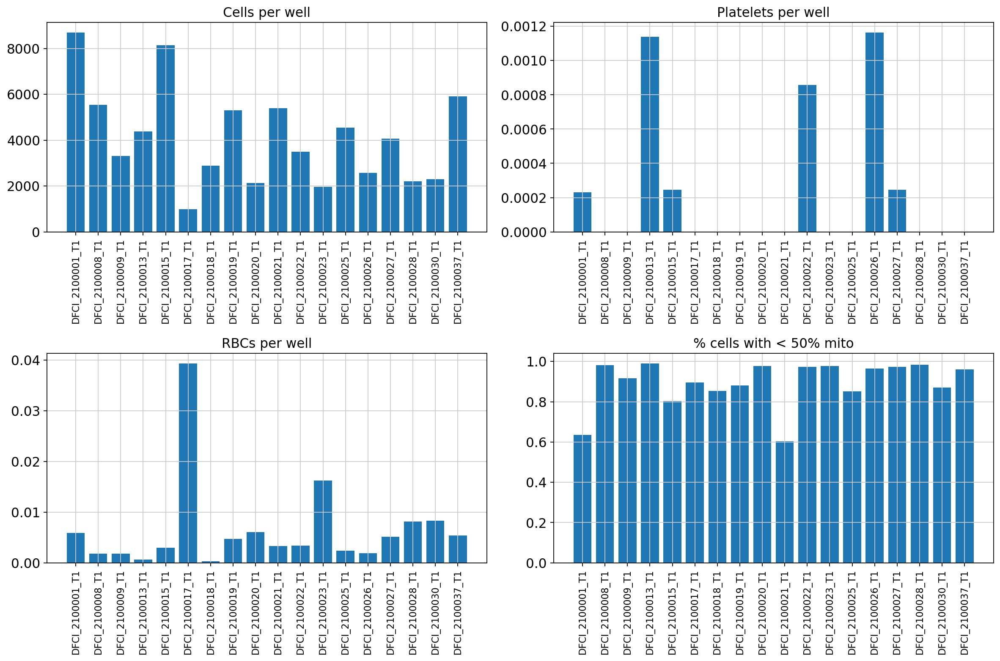

In [9]:
fig,axs = plt.subplots(2,2,figsize=(15,10),)
bars = mtxs
y_pos = np.arange(len(bars))

# plt.setp(axs, xticks=y_pos, xticklabels=bars, fontsize=2, Rotation=45)
##Plot Cells
height = contamination_df.iloc[0,:]
axs[0,0].bar(y_pos, height)
axs[0,0].set_xticks(y_pos)
axs[0,0].set_title("Cells per well")
axs[0,0].set_xticklabels(bars, fontsize=10,rotation=90)
    

##Plot Platelets
height = contamination_df.iloc[1,:]/contamination_df.iloc[0,:]
axs[0,1].bar(y_pos, height)
axs[0,1].set_xticks(y_pos)
axs[0,1].set_title("Platelets per well")
axs[0,1].set_xticklabels(bars, fontsize=10,rotation=90)


##Plot RBCs
height = contamination_df.iloc[2,:]/contamination_df.iloc[0,:]
axs[1,0].bar(y_pos, height)
axs[1,0].set_xticks(y_pos)
axs[1,0].set_title("RBCs per well")
axs[1,0].set_xticklabels(bars, fontsize=10,rotation=90)
    
##Plot % mito
height = contamination_df.iloc[3,:]
axs[1,1].bar(y_pos, height)
axs[1,1].set_xticks(y_pos)
axs[1,1].set_title("% cells with < 50% mito")
axs[1,1].set_xticklabels(bars, fontsize=10,rotation=90)
    
# Show graphic
fig.tight_layout()
fig.show()

## Batch effects removal, integration and clustering

In [10]:
adata_concat = adata[0]
adata_concat = adata_concat.concatenate(adata[1:],join='inner')
adata_concat.var = adata_concat.var[["mt","ribo"]]
print(adata_concat)

AnnData object with n_obs × n_vars = 73909 × 60627
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'platelet', 'RBC', 'batch'
    var: 'mt', 'ribo'


In [11]:
sc.pp.filter_cells(adata_concat, min_genes=200)
sc.pp.filter_genes(adata_concat, min_cells=50)

filtered out 5769 cells that have less than 200 genes expressed
filtered out 39795 genes that are detected in less than 50 cells


In [12]:
# After combining all samples to one h5ad object, we can read into this single object directly.
path = "/home/unix/sjohri/valab_sjohri/projects/ex-vivo/scanpy/integrated_analysis/"
adata_concat_file = path + "all_concat.h5ad"
adata_concat.write(adata_concat_file, compression = "gzip")

In [13]:
percent_mito_cutoff = 50

In [14]:
#Filter cells by cells with % mito
before_mito = adata_concat.X.shape[0]
adata_concat = adata_concat[adata_concat.obs.pct_counts_mt < percent_mito_cutoff, :]
print("Dead cells removed: ", before_mito - adata_concat.X.shape[0])
# adata_concat = adata_concat[adata_concat.obs['RBC'] == False]
# adata_concat = adata_concat[adata_concat.obs['platelet'] == False]

Dead cells removed:  5455


In [15]:
#Normalize gene counts
sc.pp.normalize_total(adata_concat, target_sum=1e4)

# Logarithmize the data.
sc.pp.log1p(adata_concat)

#Store raw data, for finding markers in each cluster and other analysis
adata_concat.raw = adata_concat

/home/unix/sjohri/.local/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:01)


If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:23)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


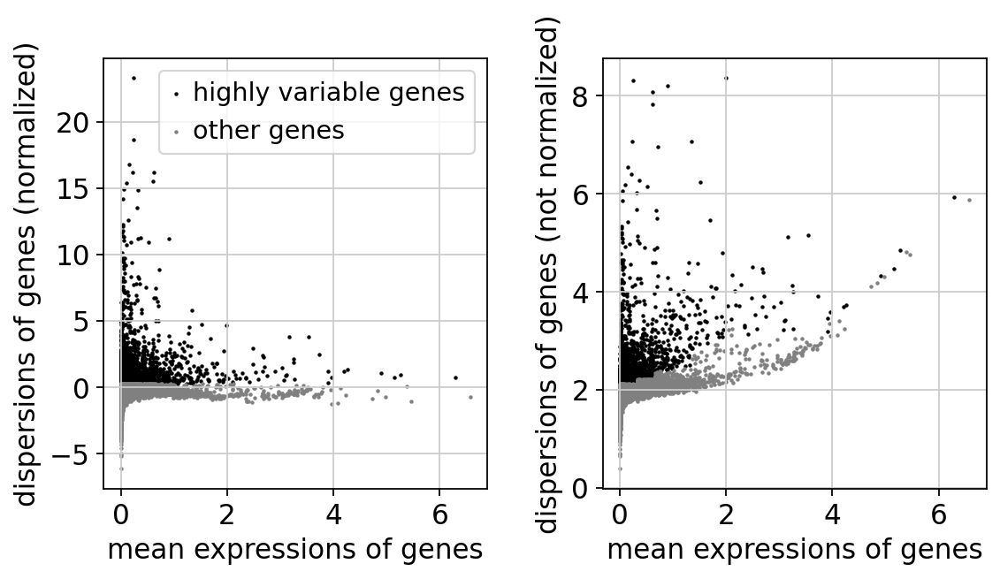

Highly variable genes: 5000


In [16]:
#variable genes for the full dataset
sc.pp.highly_variable_genes(adata_concat, n_top_genes=5000)

sc.pl.highly_variable_genes(adata_concat)

print("Highly variable genes: %d"%sum(adata_concat.var.highly_variable))

var_genes_all = adata_concat.var.highly_variable

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:01:12)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


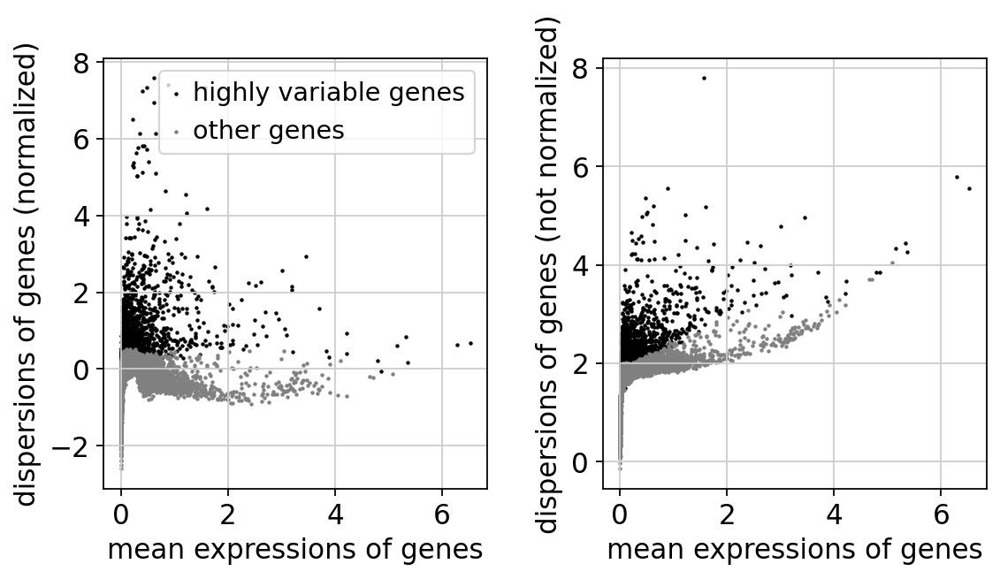

In [17]:
# Identify highly-variable genes.
sc.pp.highly_variable_genes(adata_concat, n_top_genes=5000, batch_key='batch')
sc.pl.highly_variable_genes(adata_concat)

In [18]:
print("Highly variable genes intersection: %d"%sum(adata_concat.var.highly_variable_intersection))

print("Number of batches where gene is variable:")
print(adata_concat.var.highly_variable_nbatches.value_counts())

var_genes_batch = adata_concat.var.highly_variable_nbatches > 0

Highly variable genes intersection: 202
Number of batches where gene is variable:
3     2930
4     2745
2     2705
0     2302
5     2235
1     2168
6     1618
7     1178
8      705
9      491
10     352
11     262
18     202
12     194
13     177
15     149
14     146
17     142
16     131
Name: highly_variable_nbatches, dtype: int64


In [19]:
print("Any batch var genes: %d"%sum(var_genes_batch))
print("All data var genes: %d"%sum(var_genes_all))
print("Overlap: %d"%sum(var_genes_batch & var_genes_all))
print("Variable genes in all batches: %d"%sum(adata_concat.var.highly_variable_nbatches ==3))
print("Overlap batch instersection and all: %d"%sum(var_genes_all & adata_concat.var.highly_variable_intersection))

Any batch var genes: 18530
All data var genes: 5000
Overlap: 4999
Variable genes in all batches: 2930
Overlap batch instersection and all: 202


In [20]:
var_select = adata_concat.var.highly_variable_nbatches > 1
var_genes = var_select.index[var_select]
len(var_genes)

16362

In [21]:
#Filter to highly variable genes
adata_concat = adata_concat[:,var_genes]

In [22]:
sc.pp.regress_out(adata_concat, keys = ['pct_counts_mt','total_counts'])
adata_concat

regressing out ['pct_counts_mt', 'total_counts']
    finished (0:18:03)


AnnData object with n_obs × n_vars = 62685 × 16362
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'platelet', 'RBC', 'batch', 'n_genes'
    var: 'mt', 'ribo', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'log1p', 'hvg'

In [23]:
sc.pp.scale(adata_concat, max_value=10)

In [24]:
# Set seed
intialization = 3120

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:51)


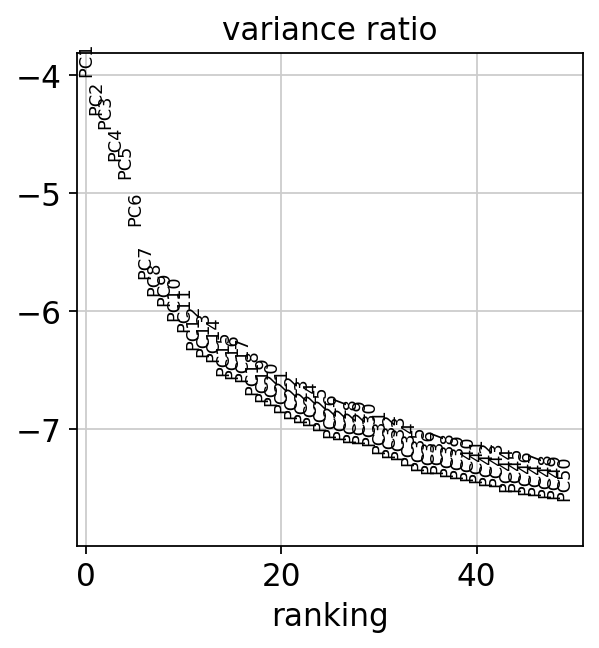

In [25]:
sc.pp.pca(adata_concat, random_state=intialization, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata_concat, n_pcs= 50, log=True, show = True)
# sc.pl.pca_overview(adata_concat,color="n_genes")

In [68]:
adata_concat.obsm['X_pca'].shape

(62685, 50)

In [67]:
adata_concat

AnnData object with n_obs × n_vars = 62685 × 16362
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'platelet', 'RBC', 'batch', 'n_genes', 'louvain', 'leiden'
    var: 'mt', 'ribo', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'louvain', 'leiden', 'umap', 'louvain_colors', 'leiden_colors', 'batch_colors', "dendrogram_['leiden']", 'dendrogram_leiden', 'rank_genes_groups'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [26]:
normalized_pca = pd.DataFrame(adata_concat.obsm['X_pca'])
meta_data = adata_concat.obs

In [27]:
sc.external.pp.harmony_integrate(adata_concat, 'batch', max_iter_harmony=50)

2021-01-06 14:42:59,755 - harmonypy - INFO - Iteration 1 of 50
2021-01-06 14:43:52,702 - harmonypy - INFO - Iteration 2 of 50
2021-01-06 14:44:44,694 - harmonypy - INFO - Iteration 3 of 50
2021-01-06 14:45:38,255 - harmonypy - INFO - Iteration 4 of 50
2021-01-06 14:46:31,437 - harmonypy - INFO - Iteration 5 of 50
2021-01-06 14:47:12,223 - harmonypy - INFO - Iteration 6 of 50
2021-01-06 14:47:46,626 - harmonypy - INFO - Iteration 7 of 50
2021-01-06 14:48:11,340 - harmonypy - INFO - Iteration 8 of 50
2021-01-06 14:48:33,639 - harmonypy - INFO - Iteration 9 of 50
2021-01-06 14:48:51,163 - harmonypy - INFO - Iteration 10 of 50
2021-01-06 14:49:08,474 - harmonypy - INFO - Iteration 11 of 50
2021-01-06 14:49:25,441 - harmonypy - INFO - Iteration 12 of 50
2021-01-06 14:49:43,313 - harmonypy - INFO - Iteration 13 of 50
2021-01-06 14:50:00,618 - harmonypy - INFO - Iteration 14 of 50
2021-01-06 14:50:18,253 - harmonypy - INFO - Iteration 15 of 50
2021-01-06 14:50:35,638 - harmonypy - INFO - Iter

In [28]:
adata_concat

AnnData object with n_obs × n_vars = 62685 × 16362
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'platelet', 'RBC', 'batch', 'n_genes'
    var: 'mt', 'ribo', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca', 'X_pca_harmony'
    varm: 'PCs'

In [29]:
adata_concat.obsm['X_pca'] = adata_concat.obsm['X_pca_harmony']

In [30]:
sc.pp.neighbors(adata_concat, random_state=intialization, n_neighbors=15, n_pcs=30)
sc.tl.louvain(adata_concat, random_state=intialization, resolution=1.0)
sc.tl.leiden(adata_concat, random_state=intialization, resolution=1.0)
sc.tl.umap(adata_concat, random_state=intialization)

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:36)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 24 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:19)
running Leiden clustering
    finished: found 26 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:23)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:59)


In [31]:
#Final written out adata object:
adata_file = "/home/unix/sjohri/valab_sjohri/projects/ex-vivo/scanpy/integrated_analysis/final_obj.h5ad"
adata_concat.write(adata_file, compression = "gzip")

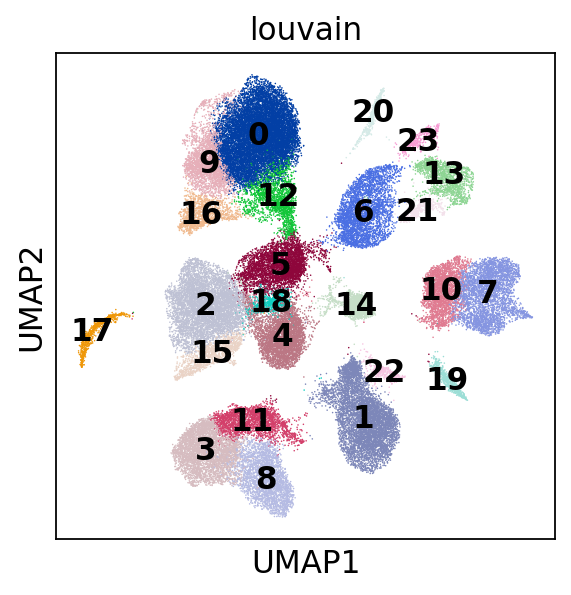

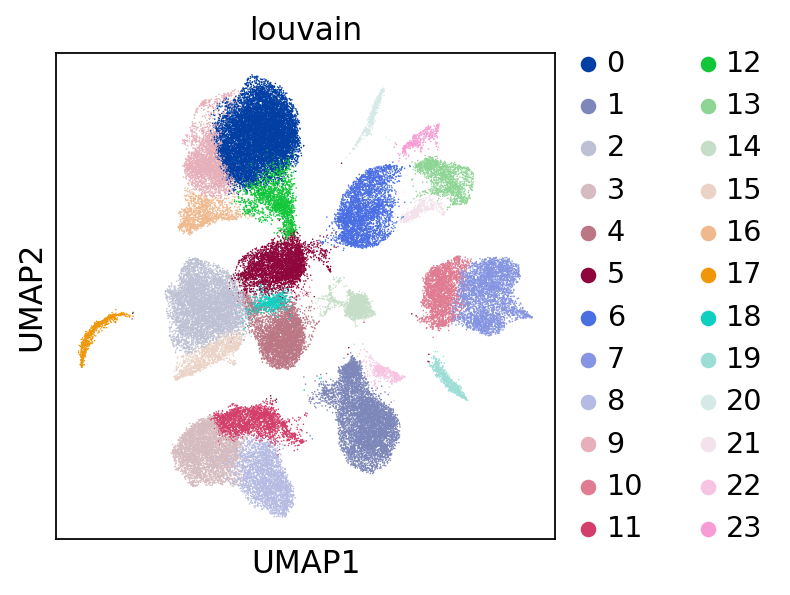

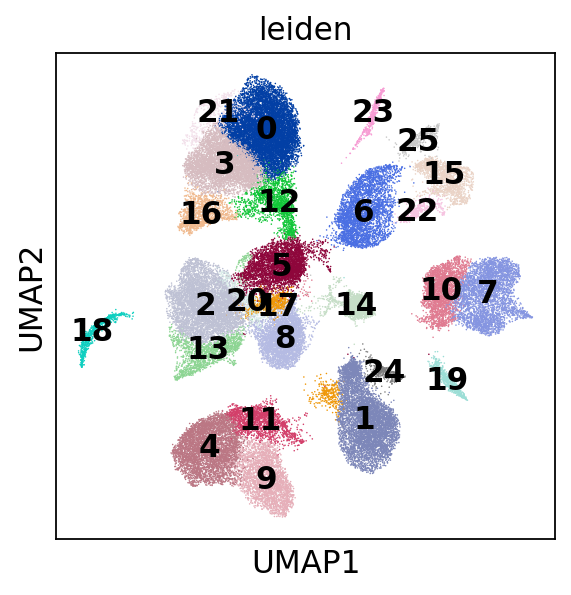

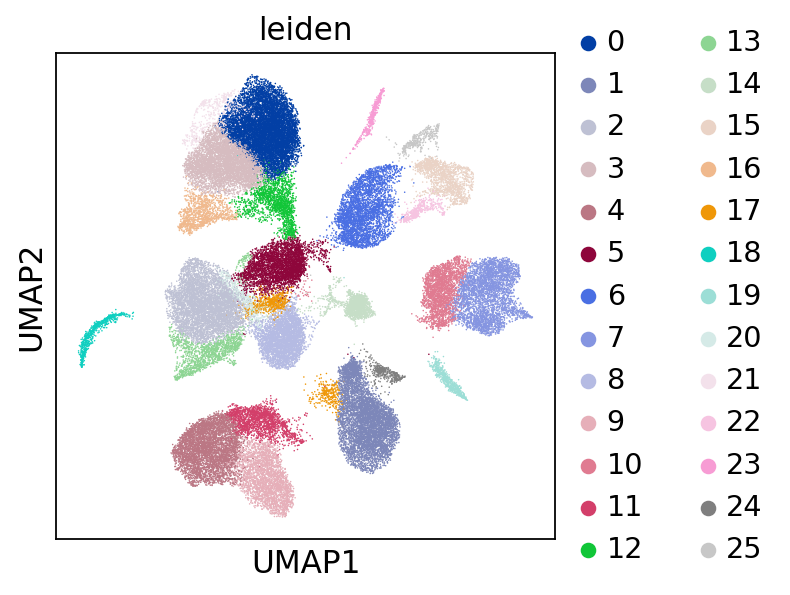

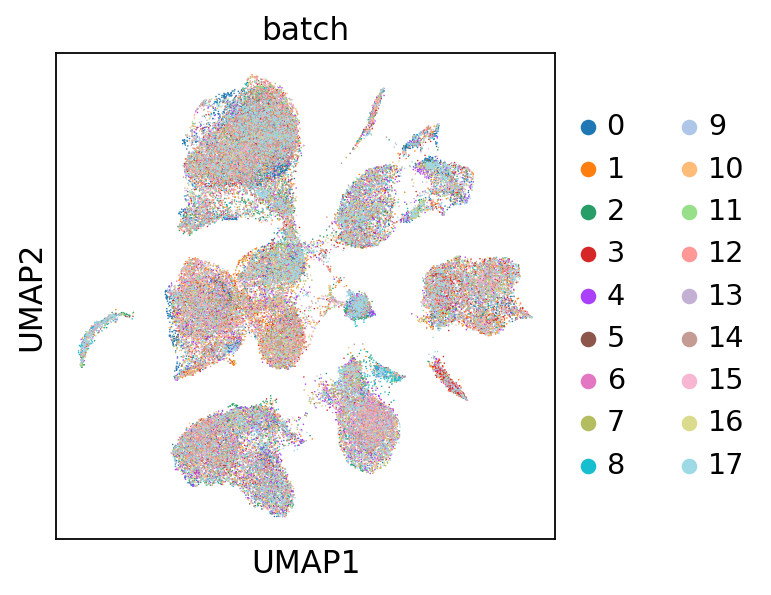

In [32]:
sc.pl.umap(adata_concat, color=['louvain'],legend_loc = 'on data', show = True)
sc.pl.umap(adata_concat, color=['louvain'], show = True)
sc.pl.umap(adata_concat, color=['leiden'],legend_loc = 'on data', show = True)
sc.pl.umap(adata_concat, color=['leiden'],  show = True)
sc.pl.umap(adata_concat, color=['batch'],  show = True)

In [33]:
leiden_prop = dict()
no_clusters = len(adata_concat.obs['leiden'].unique())
for sn in adata_concat.obs['batch'].unique():
    temp = adata_concat[adata_concat.obs['batch'] == sn,:]
    cell_count = temp.obs['leiden'].value_counts()
    cell_count = cell_count.sort_index()
    cell_count = cell_count.to_dict()
    cell_count = [cell_count[str(x)] if str(x) in cell_count.keys() else 0 for x in range(0,no_clusters)]
    leiden_prop[sn] = cell_count

In [34]:
leiden_prop = pd.DataFrame(leiden_prop).T

In [35]:
leiden_prop['total'] = leiden_prop.sum(axis = 1)
leiden_prct = pd.DataFrame()
for x in leiden_prop.columns:
    leiden_prct[x] = leiden_prop[x]/leiden_prop[x].sum()
leiden_prct = leiden_prct.sort_index()

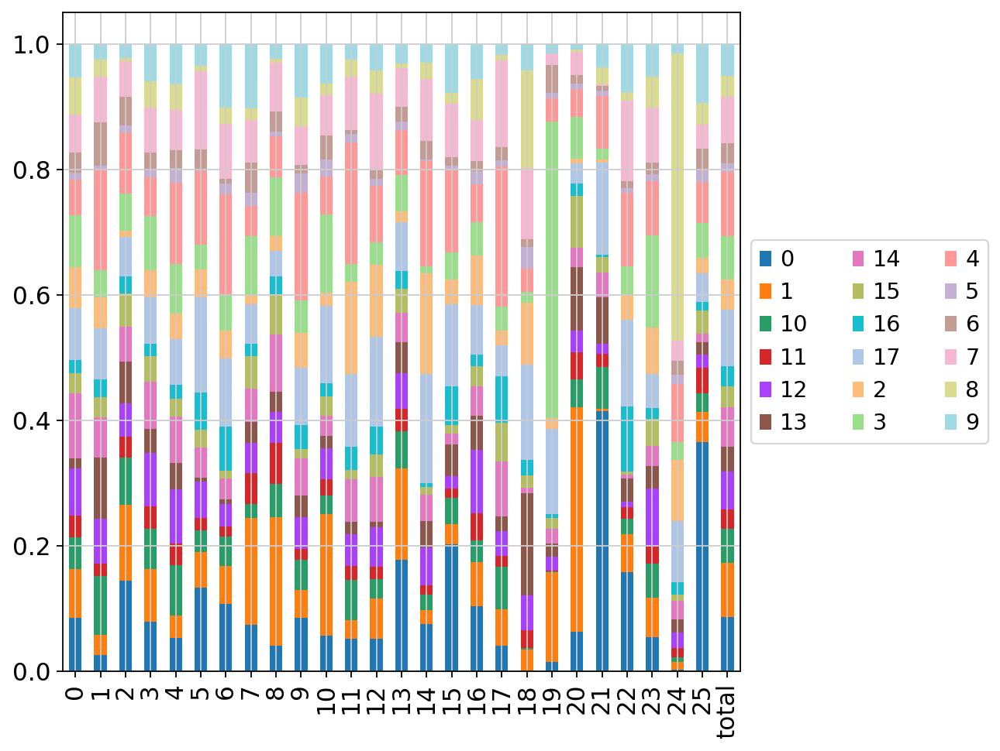

In [36]:
leiden_prct.T.plot.bar(stacked=True, legend = False,figsize=(7,7))
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), ncol = 3)

In [37]:
adata_concat

AnnData object with n_obs × n_vars = 62685 × 16362
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'platelet', 'RBC', 'batch', 'n_genes', 'louvain', 'leiden'
    var: 'mt', 'ribo', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'louvain', 'leiden', 'umap', 'louvain_colors', 'leiden_colors', 'batch_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

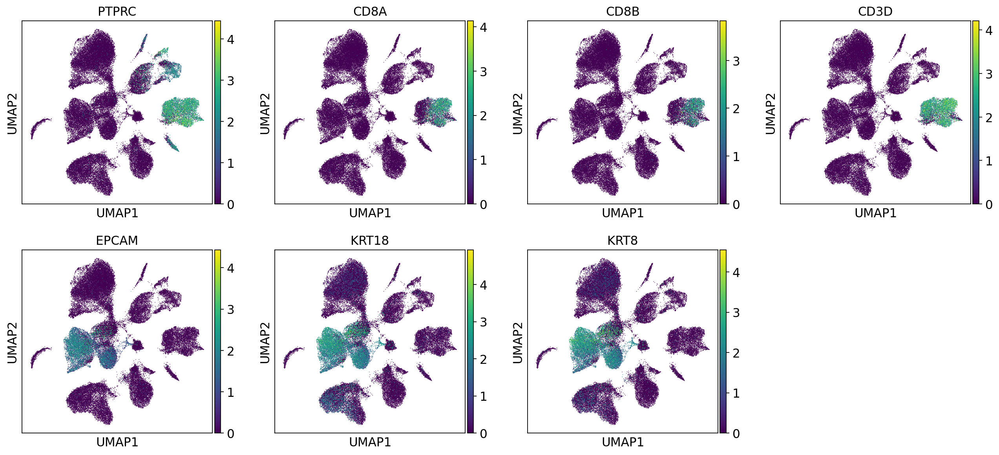

In [40]:
sc.pl.umap(adata_concat, color=['PTPRC','CD8A','CD8B','CD3D','EPCAM','KRT18','KRT8'],  show = True)

In [41]:
markers = pd.read_csv("/home/unix/sjohri/valab_sjohri/projects/ex-vivo/data/PanglaoDB_markers_27_Mar_2020.tsv", sep="\t")

In [42]:
hs_markers = markers[markers.species!="Mm"]

In [56]:
marker_genes_dict = {'Endothelial': [x for x in hs_markers[(hs_markers.cell_type=="Endothelial cells") & (hs_markers.canonical_marker==1) 
           & (hs_markers.ubiquitousness_index<=0.1) & (hs_markers.sensitivity_human>=0.75) 
           & (hs_markers.specificity_human<=0.25)].official_gene_symbol if x in adata_concat.raw.var_names],
                     'Smooth_muscle': [x for x in hs_markers[(hs_markers.cell_type=="Smooth muscle cells") & (hs_markers.canonical_marker==1) 
           & (hs_markers.ubiquitousness_index<=0.1) & (hs_markers.sensitivity_human>=0.75) 
           & (hs_markers.specificity_human<=0.25)].official_gene_symbol if x in adata_concat.raw.var_names],
                     'Epithelial': [x for x in hs_markers[(hs_markers.cell_type=="Epithelial cells") 
           & (hs_markers.ubiquitousness_index<=0.1) & (hs_markers.sensitivity_human>=0.75) 
           & (hs_markers.specificity_human<=0.25)].official_gene_symbol if x in adata_concat.raw.var_names],
                     'Fibroblasts': [x for x in hs_markers[(hs_markers.cell_type=="Fibroblasts") & (hs_markers.canonical_marker==1) 
           & (hs_markers.ubiquitousness_index<=0.1) & (hs_markers.sensitivity_human>=0.75) 
           & (hs_markers.specificity_human<=0.25)].official_gene_symbol if x in adata_concat.raw.var_names],
                    'Leukocytes': ['PTPRC','CD3D','MS4A1','NKG7','CD8A','GNLY','FCER1A','C1QA','C1QB','TYROBP','LYZ','AIF1'],
                    'Neuro': ['NRXN1','GPM6B','S100B','CRYAB']}

categories: 0, 1, 2, etc.
var_group_labels: Endothelial, Smooth_muscle, Epithelial, etc.


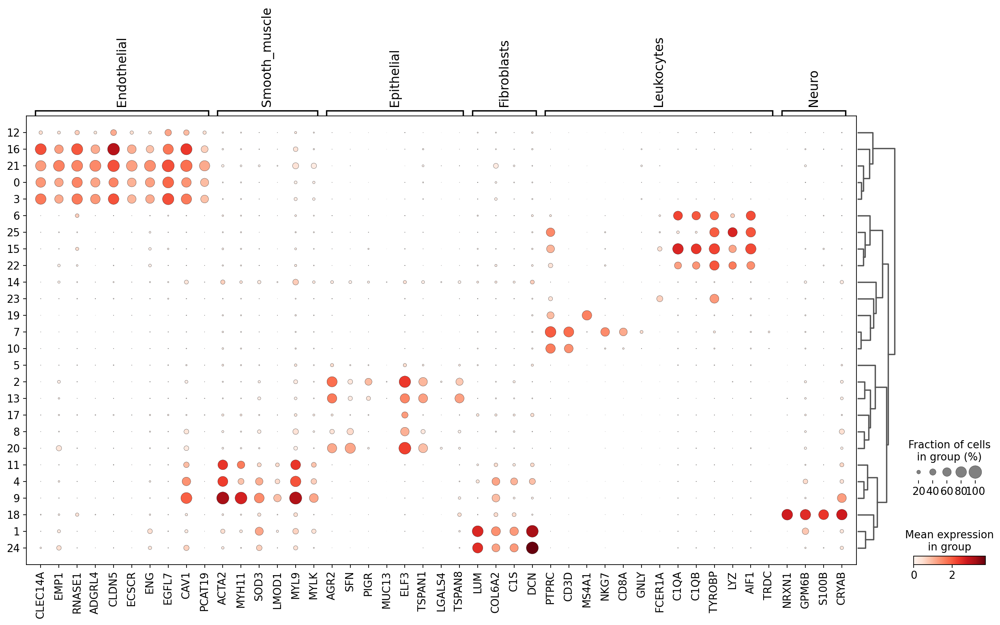

In [57]:
sc.pl.dotplot(adata_concat, marker_genes_dict,"leiden", dendrogram=True)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


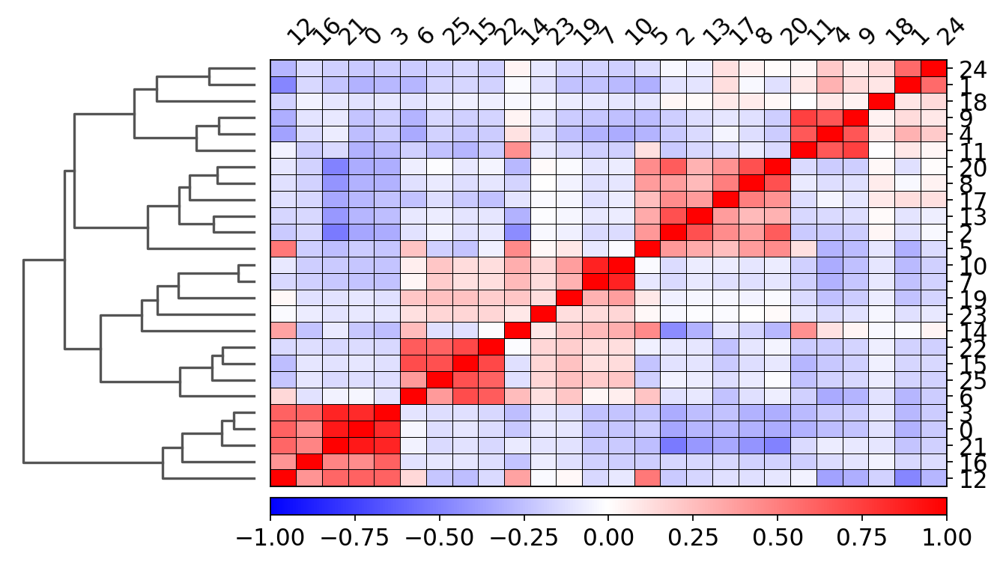

In [49]:
ax=sc.pl.correlation_matrix(adata_concat,groupby='leiden', figsize=(10,5))

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:06:56)


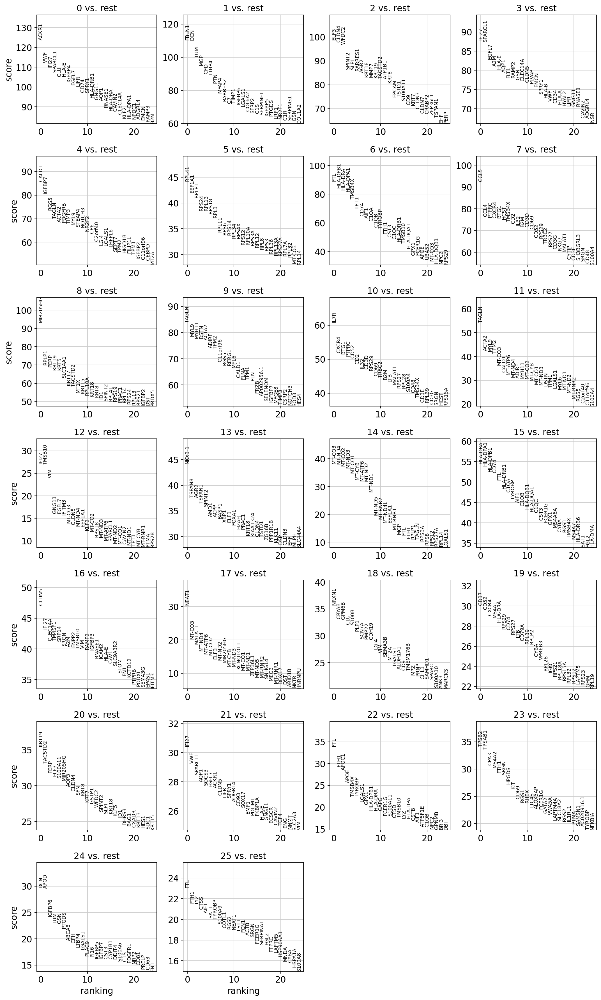

In [58]:
sc.tl.rank_genes_groups(adata_concat, 'leiden', method='wilcoxon', corr_method="benjamini-hochberg")
sc.pl.rank_genes_groups(adata_concat, n_genes=25, sharey=False)

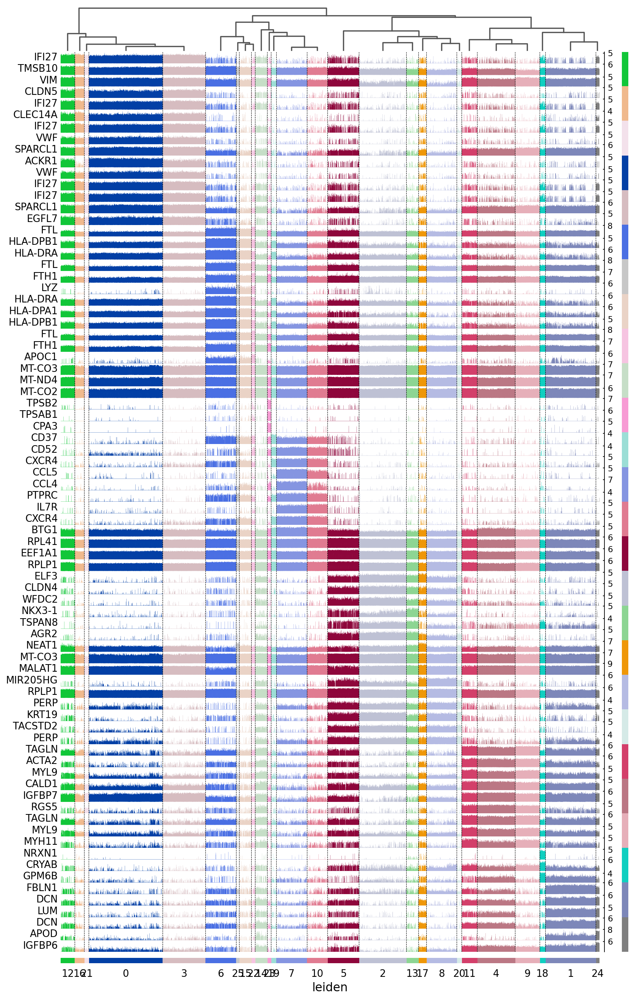

In [60]:
sc.pl.rank_genes_groups_tracksplot(adata_concat, n_genes=3)

In [39]:
# sc.tl.rank_genes_groups(adata_concat,'leiden', method='wilcoxon', corr_method="benjamini-hochberg")
# sc.pl.rank_genes_groups(adata_concat, n_genes=25, sharey=False)